# STAN
STAN is a computational framework for inferring spatially informed transcription factor activity across cellular contexts. Specifically, STAN is a linear mixed-effects computational method that predicts spot-specific, spatially informed TF activities by integrating curated TF-target gene priors, mRNA expression, spatial coordinates, and morphological features from corresponding imaging data.

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.metrics import mean_squared_error

import warnings 
warnings.filterwarnings('ignore') 

import stan

## Loading the spatial transcriptomics  data
For this tutorial, we will analyze a dataset of a human lymphnode freely available from 10X Genomics. The raw lymph node data can be downloaded using scanpy.

In [2]:
adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 4035 × 36601
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

We will assign germinal centers and cell type to each spot. The resource files can be downloaded from [here](https://raw.githubusercontent.com/vitkl/cell2location_paper/1c645a0519f8f27ecef18468cf339d35d99f42e7/notebooks/selected_results/lymph_nodes_analysis/CoLocationModelNB4V2_34clusters_4039locations_10241genes_input_inferred_V4_batch1024_l2_0001_n_comb50_5_cps5_fpc3_alpha001/W_cell_density.csv) and [here](https://raw.githubusercontent.com/vitkl/cell2location_paper/1c645a0519f8f27ecef18468cf339d35d99f42e7/notebooks/selected_results/lymph_nodes_analysis/CoLocationModelNB4V2_34clusters_4039locations_10241genes_input_inferred_V4_batch1024_l2_0001_n_comb50_5_cps5_fpc3_alpha001/manual_GC_annot.csv). 

In [3]:
celltypes = pd.read_csv("resources_stan/W_cell_density.csv", index_col=0)
gc_annotation = pd.read_csv("resources_stan/manual_GC_annot.csv", index_col=0).fillna(0).replace("GC", 1)

obs_names = np.intersect1d(celltypes.index, adata.obs_names)
adata = adata[obs_names]
celltypes = celltypes.loc[obs_names]
gc_annotation = gc_annotation.loc[obs_names]
adata.obsm['celltype'] = celltypes
adata.obsm['celltype'].columns = [x.replace('mean_spot_factors','') for x in adata.obsm['celltype'].columns]
adata.obsm['celltype_raw'] = adata.obsm['celltype'].copy()
adata.obsm['celltype'] = adata.obsm['celltype'].divide(adata.obsm['celltype'].sum(axis=1), axis=0)
adata.obs['germinal_center'] = gc_annotation
adata.obs['germinal_center'] = adata.obs['germinal_center'].map({0: "Other", 1: "GC"})

Perform some basic filtering of genes and spots.

In [4]:
sc.pp.filter_genes(adata, min_cells=5)
sc.pp.filter_cells(adata, min_counts=5000)

In [5]:
adata.layers['raw'] = adata.X
adata.obs['ncounts'] = adata.to_df('raw').T.sum()

Write the processed data to file.

In [6]:
!mkdir outputs_stan/
adata.write("outputs_stan/lymphnode.h5ad")

mkdir: outputs_stan/: File exists


## Loading the gene-TF prior matrix
We obtain a gene set resource comprising TF–target gene priors from [hTFtarget](https://guolab.wchscu.cn/hTFtarget/#!/), and retain only those TFs that were identified in the Human Transcription Factor database [(humantfs)](https://www.cell.com/cell/fulltext/S0092-8674(18)30106-5) to generate the TF–target gene prior matrix. For first time use, the prior information will be downloaded to the directory `data/gene_tf` by default.

For the ST dataset, the TF–target gene prior matrix (referred to as $D$) and the spot-level gene expression matrix (referred to as $Y$) undergo a sequential filtering process:
- In $Y$, genes expressed in less than 20% of the spots are removed. 
- Only mutual genes present in both matrices are retained. 
- In $D$, genes associated with less than 5 remaining TFs are removed, and TFs associated with fewer than 10 remaining genes are removed.

All paramters are tunable. The filtered TF–target gene prior matrix is stored in `adata.varm['gene_tf']`.

In [7]:
adata = stan.add_gene_tf_matrix(adata,
                                min_cells_proportion = 0.2,
                                min_tfs_per_gene= 5,
                                min_genes_per_tf= 10,
                                gene_tf_source="hTFtarget",
                                tf_list="humantfs",
                                source_dir="resources_stan/")

## Computing the spatially dependent kernel
A Gaussian kernel matrix $K$,  stored in `adata.obsm['kernel']`, is computed based on the spatial and morphological information of the spot and a neighborhood of a square.
-  `windowsize`: length of the half side of the square (unit: pixel).
- `bandwidth`: band width using the computation of $K$.
- `im_feats_weight`: morphological info to spatial info ratio.
- `n`: the top $n$ singular values of $A$ in SVD.

All paramters are tunable. The spatial and morphological information is stored in `adata.obsm['spatial']` and `adata.obsm['pixel']` respectively, and are normalized to have zero mean and unit variance for each component.

In [8]:
stan.pixel_intensity(adata, windowsize=25)
stan.make_kernel(adata, n=250, im_feats_weight=0.05, bandwidth=0.2)

Time elapsed: 0.24 seconds
Time elapsed: 6.83 seconds


Normalize each spot by total counts over all genes, and then square root transform the total count to stabilize the variance.

In [9]:
sc.pp.normalize_total(adata)
adata.layers['scaled'] = np.sqrt(adata.to_df())

## TF activity inference using STAN

In [10]:
stan.assign_folds(adata, n_folds=10, random_seed=0)
stan_model = stan.Stan(adata, layer='scaled')
stan_model.fit(n_steps=5, stages=1,
              grid_search_params={'lam1':[1e-4, 1e4], 'lam2':[1e-4, 1e4]})

Time elapsed: 128.11 seconds


In [11]:
adata.obsm['tfa_stan'] = pd.DataFrame(
    stan_model.W_concat.T, index=adata.obs_names, columns=adata.uns['tf_names'])

Evaluate the cross validation performance using Pearsonr correlation coefficient and mean squared error.

In [12]:
cor, gene_cor = stan_model.evaluate(fold=-1)
adata.obs['pred_cor_stan'] = cor
adata.var['pred_cor_stan'] = gene_cor

print(stan_model.params)
print("Spot-wise correlation:" + str(round(np.nanmedian(cor), 4)))
print("Gene-wise correlation: " + str(round(np.nanmedian(gene_cor), 4)))

{'lam1': 10000.0, 'lam2': 0.0001}
Spot-wise correlation:0.2317
Gene-wise correlation: 0.0921


In [13]:
Y = adata.varm['gene_tf'].dot(stan_model.W_concat)
mean_squared_error(Y, adata.to_df('scaled').T)

1.0439224714002515

### Compare STAN with Ridge regression (baseline)

In [14]:
ridge_model = stan.Ridge(adata, layer='scaled')
ridge_model.fit(n_steps=5, stages=1,
                grid_search_params={'lam':[1e-4, 1e4]})

adata.obsm['tfa_ridge'] = pd.DataFrame(
    ridge_model.W_concat.T, index=adata.obs_names, columns=adata.uns['tf_names'])

Time elapsed: 29.46 seconds


In [15]:
cor, gene_cor = ridge_model.evaluate(fold=-1)
adata.obs['pred_cor_ridge'] = cor
adata.var['pred_cor_ridge'] = gene_cor

print(ridge_model.params)
print("Spot-wise correlation:" + str(round(np.nanmedian(cor), 4)))
print("Gene-wise correlation:" + str(round(np.nanmedian(gene_cor), 4)))

Y = adata.varm['gene_tf'].dot(ridge_model.W_concat)
print("   Mean squared error:" + str(round(np.nanmedian(gene_cor), 4)))
mean_squared_error(Y, adata.to_df('scaled').T)

{'lam': 0.0001}
Spot-wise correlation:0.2237
Gene-wise correlation:0.0619
   Mean squared error:0.0619


1.0354316848848208

## Saving results to file 

In [16]:
adata.write("outputs_stan/lymphnode_stan.h5ad")

# Analyzing results of STAN

In [17]:
from anndata import AnnData
from scipy.stats import pearsonr, spearmanr, wilcoxon
import matplotlib.pyplot as plt
import squidpy as sq

import auxiliary_stan as aux
figsize = aux.figsize
fontsize = aux.fontsize

## Loading the ST data

In [18]:
# input of STAN
adata_raw = sc.read_h5ad("outputs_stan/lymphnode.h5ad")
# output of STAN
adata_stan = sc.read_h5ad("outputs_stan/lymphnode_stan.h5ad")

Extract the inferred TF activity matrix.

In [19]:
adata_tfa = AnnData(
    X = adata_stan.obsm['tfa_stan'],
    obs = adata_stan.obs,
    obsm = {name: obj for (name, obj) in adata_stan.obsm.items() if "tf" not in name},
    layers = {name: obj for (name, obj) in adata_stan.obsm.items() if "tf" in name})
adata_tfa.uns = adata_stan.uns

For mRNA expression, normalize each spot by total counts over all genes

In [20]:
sc.pp.normalize_total(adata_raw)
adata_raw.layers['scaled'] = np.sqrt(adata_raw.to_df())

sc.pp.normalize_total(adata_stan)
adata_stan.layers['scaled'] = np.sqrt(adata_stan.to_df())

## Visualizing the H&E stained image and the germinal centers

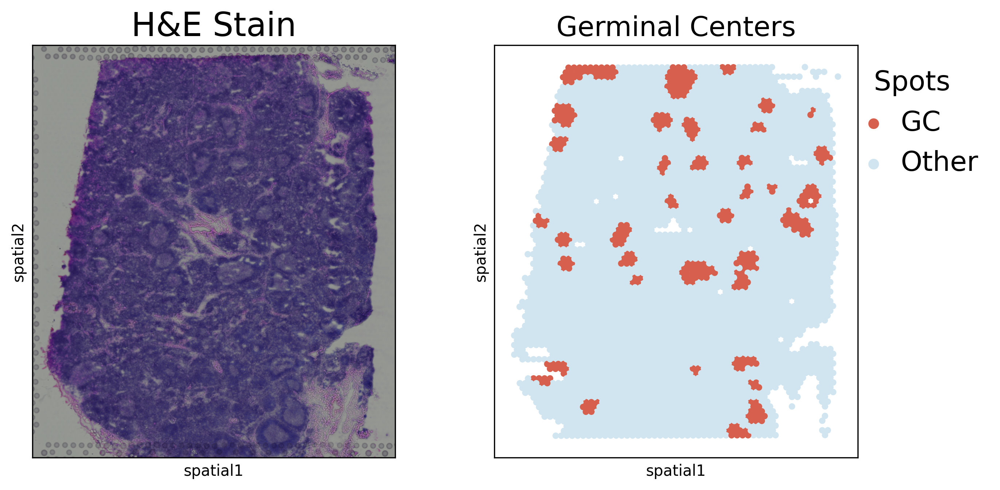

In [21]:
fig, axs = plt.subplots(1,2, figsize=(2*figsize, figsize), dpi=300)
plt.rc('font', size=fontsize) 
sc.pl.spatial(adata_stan, ax=axs[0], show=False, title="H&E Stain")

sc.pl.spatial(adata_stan, color='germinal_center', size=1.8, alpha_img=0, 
              palette={"GC":'#d6604d', "Other":'#d1e5f0'},
              ax=axs[1], show=False, legend_fontsize=fontsize)
axs[1].set_title('Germinal Centers', fontsize=fontsize)
plt.legend(title="Spots", loc='upper right', bbox_to_anchor=(1.4, 1), columnspacing=0.5, handletextpad=0, frameon=False)

## Visualizing the cross validation performance

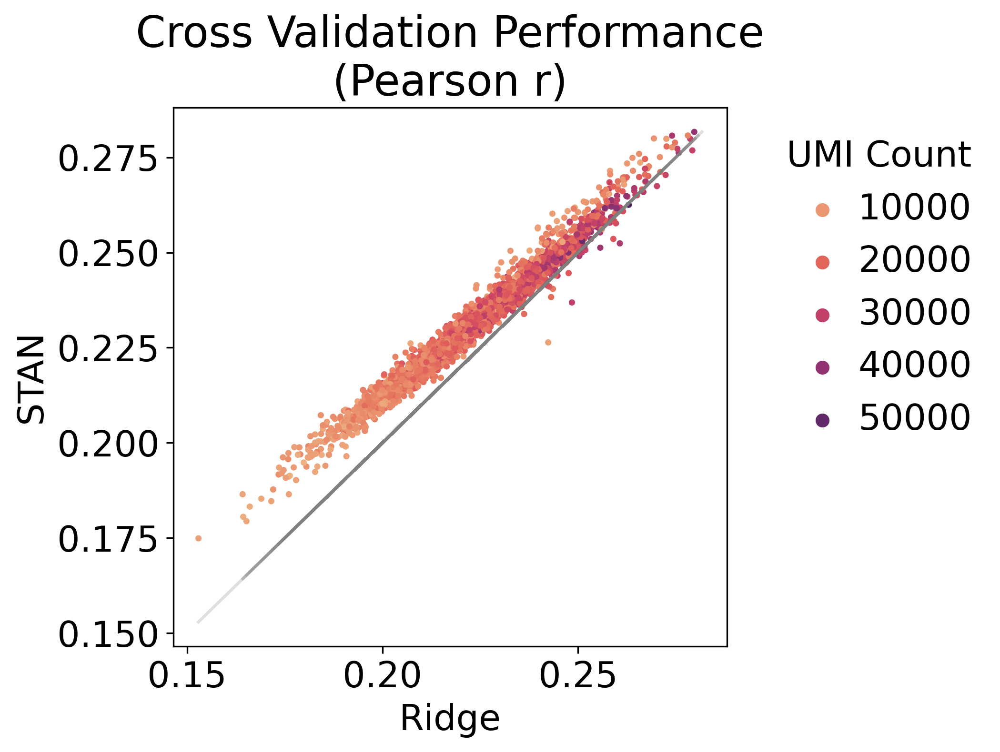

In [22]:
aux.plot_validation(adata_stan)

### Statistics

In [23]:
wilcoxon(adata_stan.obs["pred_cor_stan"], adata_stan.obs["pred_cor_ridge"], 
         zero_method='wilcox', correction=False, alternative='greater')

WilcoxonResult(statistic=7945420.0, pvalue=0.0)

In [24]:
pearsonr(adata_stan.obs["pred_cor_stan"]-adata_stan.obs["pred_cor_ridge"],
         adata_stan.obs["n_counts"])

PearsonRResult(statistic=-0.520273503029421, pvalue=1.2793245463051766e-275)

## Embedding and Clustering

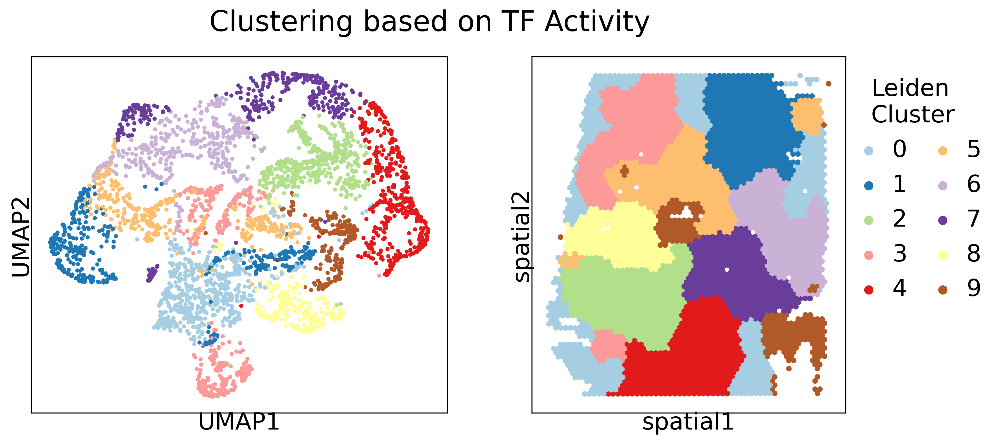

In [25]:
adata_tfa_scaled = adata_tfa.copy()
sc.pp.scale(adata_tfa_scaled)
sc.pp.neighbors(adata_tfa_scaled, use_rep='X', n_neighbors=100)
sc.tl.umap(adata_tfa_scaled, min_dist=0.01)
sc.tl.leiden(adata_tfa_scaled, resolution=0.6)
aux.plot_umap(adata_tfa_scaled, palette='Paired')

More than half germinal centers are in Cluster 0.

In [26]:
pd.value_counts(adata_tfa_scaled.obs['leiden'][adata_tfa_scaled.obs['germinal_center']=='GC'])

leiden
0    203
7     48
8     39
1     31
5     18
6     16
3     10
4      3
2      0
9      0
Name: count, dtype: int64

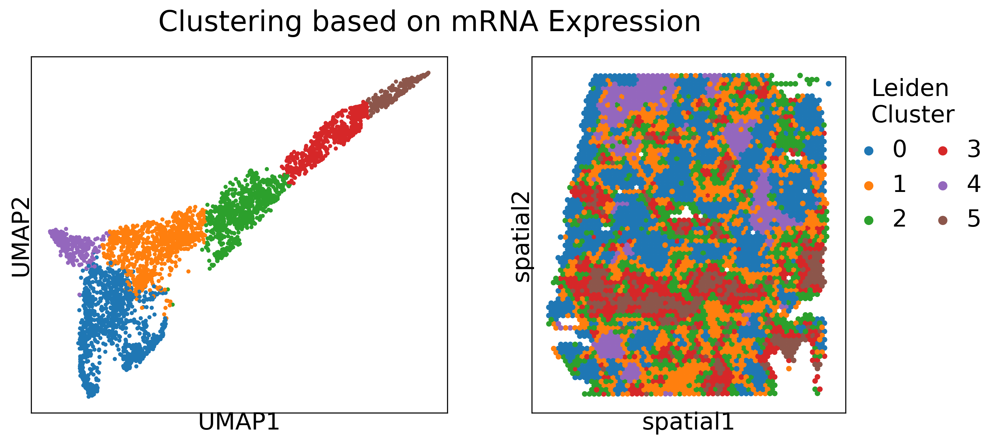

In [27]:
sc.pp.neighbors(adata_raw, use_rep='X', n_neighbors=100)
sc.tl.umap(adata_raw, min_dist=0.01)
sc.tl.leiden(adata_raw, resolution=0.42)
aux.plot_umap(adata_raw, palette=None, is_tf=False)

## Visualizing TFa in spatial coordinates
### Ranking TFs and genes

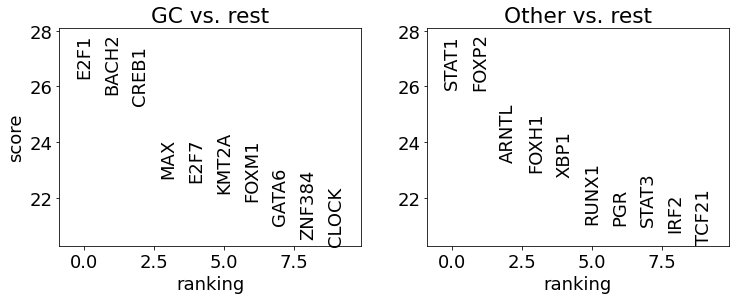

In [28]:
adata_tfa.obs['germinal_center'] = adata_tfa.obs['germinal_center'].astype('category')
sc.tl.rank_genes_groups(adata_tfa, groupby='germinal_center', method="wilcoxon")
sc.pl.rank_genes_groups(adata_tfa, fontsize=fontsize, n_genes=10)

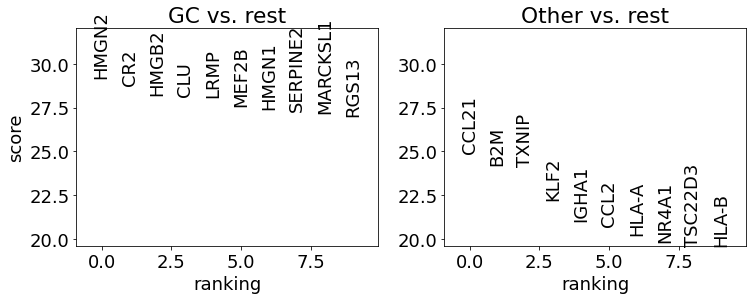

In [29]:
adata_raw.obs['germinal_center'] = adata_raw.obs['germinal_center'].astype('category')
sc.tl.rank_genes_groups(adata_raw, groupby='germinal_center', method="wilcoxon")
sc.pl.rank_genes_groups(adata_raw, fontsize=fontsize, n_genes=10)

### Edges of the germinal centers

In [30]:
points, edges = aux.find_edges(adata_raw)

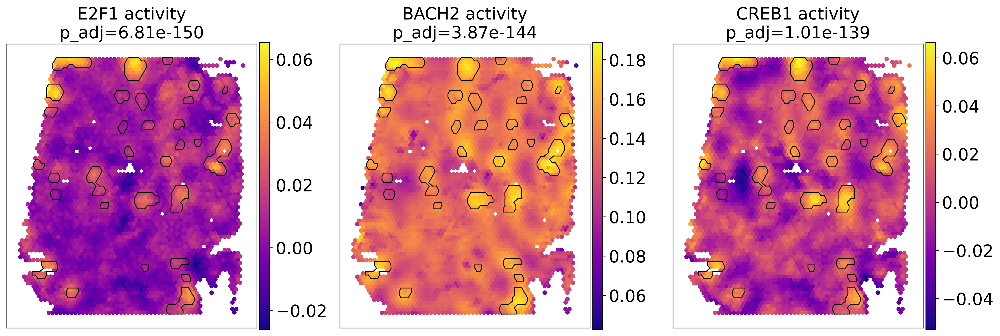

In [31]:
aux.plot_spatial_activity(adata_tfa, ['E2F1', 'BACH2', 'CREB1'], points, edges)

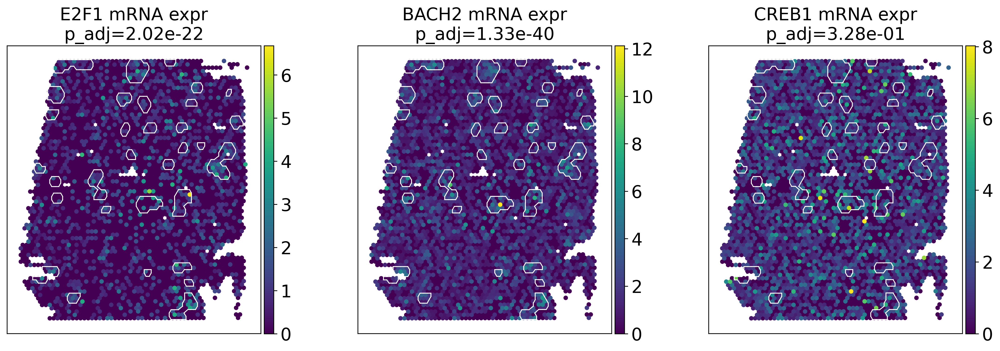

In [32]:
aux.plot_spatial_expression(adata_raw, ['E2F1', 'BACH2', 'CREB1'], points, edges)

## Correlating celltype proportion and TF activity

In [33]:
df_celltype = aux.merge_celltypes(adata_raw)
adata_raw.obsm['celltype_major'] = df_celltype
adata_stan.obsm['celltype_major'] = df_celltype
adata_tfa.obsm['celltype_major'] = df_celltype  

In [34]:
mat_cor_tfa, mat_cor_rna = aux.make_cor_dataframe(adata_raw, adata_tfa, celltype_label='celltype_major')

In [41]:
mat_cor_tfa.head()

,B_Cycling,B_GC,B_IFN,B_activated,B_mem,B_naive,B_plasma,B_preGC,DC,Endo,...,Mast,Monocytes,NK,NKT,T_CD4+,T_CD8+,T_Treg,T_TIM3+,T_TfR,VSMC
AHR,-0.276240,-0.147060,-0.087354,0.115376,-0.077029,0.128611,0.075983,-0.134929,-0.183921,0.016465,...,-0.033204,0.049248,0.160765,-0.016103,0.111254,0.259115,0.230179,0.022061,0.118067,0.009751
AR,-0.158542,0.046463,0.057674,0.136695,-0.252243,0.158676,0.098574,-0.285753,-0.243052,0.040096,...,-0.048461,0.059397,0.296494,-0.045594,-0.013891,0.257191,0.216528,0.085512,0.073692,0.029291
ARID3A,-0.061208,-0.145091,-0.238221,0.103198,0.326166,-0.162736,0.085172,0.153184,0.305626,0.255499,...,0.168252,0.223700,-0.191168,0.242667,-0.050385,-0.200080,-0.235146,-0.271558,-0.136760,0.257415
ARNT,-0.291987,-0.167419,-0.101678,0.343416,-0.085983,0.166052,0.350323,-0.141685,-0.161122,0.193895,...,0.012809,0.215530,0.278905,0.097506,-0.095701,0.200275,0.073262,0.083561,-0.084945,0.282942
ARNTL,-0.463539,-0.430262,-0.085855,0.153867,-0.072358,-0.025665,0.249037,-0.000812,-0.046538,0.180260,...,0.029348,0.193963,0.179167,0.149627,0.212676,0.380482,0.313099,0.092649,0.225874,0.252578


In [42]:
mat_cor_rna.head()

,B_Cycling,B_GC,B_IFN,B_activated,B_mem,B_naive,B_plasma,B_preGC,DC,Endo,...,Mast,Monocytes,NK,NKT,T_CD4+,T_CD8+,T_Treg,T_TIM3+,T_TfR,VSMC
AHR,0.009223,-0.000835,-0.010662,-0.023063,0.063908,-0.060321,-0.063801,0.040088,0.150313,0.119125,...,0.081089,0.031334,-0.064529,0.063505,-0.038818,-0.076397,-0.062192,-0.029661,-0.013476,0.052146
AR,-0.009376,-0.010489,-0.017858,0.001706,0.008719,-0.002219,-0.009217,-0.011876,0.007907,0.038644,...,-0.001375,0.013970,-0.018990,0.028066,-0.000555,0.010018,0.000673,-0.015991,0.006417,0.046093
ARID3A,-0.055220,-0.075344,0.011635,0.051627,0.002791,0.021276,0.060188,0.057354,0.016473,0.031431,...,0.034463,0.018450,0.032617,0.014080,-0.027219,0.008611,-0.013244,0.066422,-0.028671,0.018042
ARNT,-0.030451,-0.012786,-0.022875,0.015264,0.028499,0.014650,-0.013350,0.004472,-0.000996,0.041280,...,-0.007123,0.037205,-0.014431,0.011950,-0.002681,-0.012970,-0.004977,-0.025344,0.004242,0.020302
ARNTL,-0.043328,-0.028302,-0.000723,-0.010249,-0.051037,0.009817,-0.018236,-0.019914,-0.021207,-0.012650,...,0.001419,0.012348,0.044289,-0.024363,0.037909,0.083752,0.078833,0.060272,0.056722,-0.006029


### Visualization

In [35]:
def plot_spatial_ct_tf(ct, tf):
    fig, axs = plt.subplots(1,3, figsize=(figsize*3,figsize), dpi=100)
    sc.pl.spatial(sq.pl.extract(adata_tfa, "celltype_major"),
                  color=ct, alpha_img=0, ax=axs[0], show=False, cmap="rocket", size=1.8,
                  legend_fontsize=fontsize)
    sc.pl.spatial(adata_tfa, color=tf, alpha_img=0, ax=axs[1],show=False, cmap="plasma", 
                  legend_fontsize=fontsize, size=1.8)
    sc.pl.spatial(adata_raw, color=tf, alpha_img=0, ax=axs[2],show=False, cmap="viridis", 
                  legend_fontsize=fontsize, size=1.8)

    axs[0].set_title(ct+'\n', fontsize=fontsize)
    axs[1].set_title(tf+' activity\npearson=%.4f'% mat_cor_tfa.loc[tf, ct], fontsize=fontsize)
    axs[2].set_title(tf+" mRNA expr\npearson=%.4f"% mat_cor_rna.loc[tf, ct], fontsize=fontsize)
    for i in range(3):
        axs[i].set_xlabel("")
        axs[i].set_ylabel("")
    plt.tight_layout(pad=0.6)

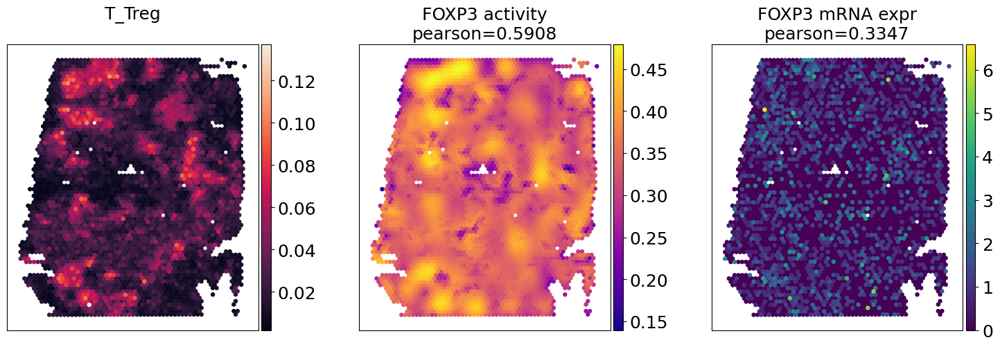

In [36]:
plot_spatial_ct_tf(ct = "T_Treg", tf = "FOXP3")

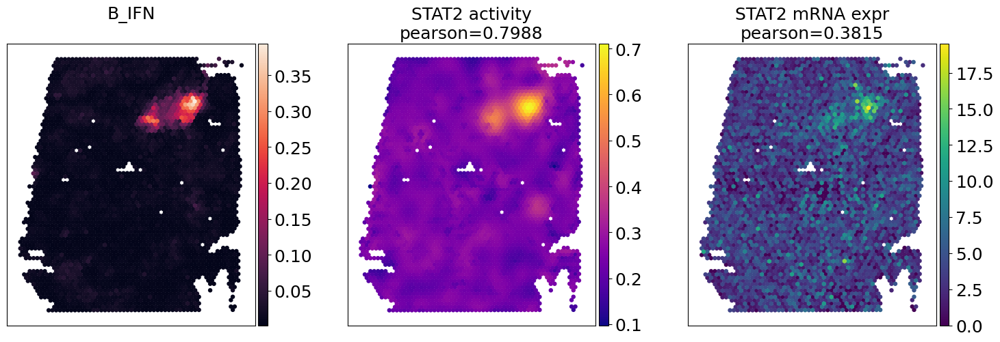

In [37]:
plot_spatial_ct_tf(ct = "B_IFN", tf = "STAT2")

## Computing celltype-specific TF activity scores

In [38]:
df_ct_tf = aux.make_ct_tf_dataframe(adata_tfa, celltype_label='celltype_major')

In [40]:
df_ct_tf.head()

,tf,ct,coef,p,SE,r_squared,p_adj,negative_log_p_adj
0,AHR,B_Cycling,-4.973369,1.172848e-15,0.618559,0.156685,1.966438e-14,9.999915
1,AHR,B_GC,-0.061952,9.314710e-01,0.720373,0.156685,9.539960e-01,0.020453
2,AHR,B_IFN,-2.560567,8.796694e-07,0.519952,0.156685,5.107207e-06,5.291808
3,AHR,B_activated,8.397171,7.907492e-06,1.877057,0.156685,3.933283e-05,4.405244
4,AHR,B_mem,0.361996,3.613507e-01,0.396534,0.156685,4.720362e-01,0.326025


### Visualization

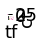

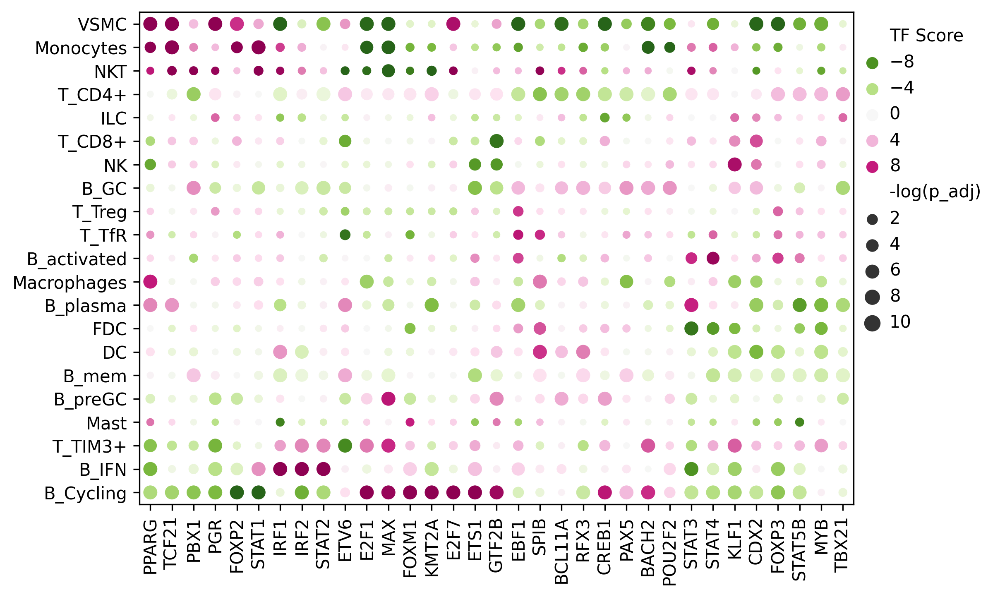

In [39]:
df_filtered = df_ct_tf.query("negative_log_p_adj>2").query('coef>4').query("r_squared>0.4")
tf_list = df_filtered['tf'].unique()
ct_list = df_filtered['ct'].unique()
aux.plot_heatmap(df_ct_tf, tf_list, ct_list)